## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!pwd

/home/ubuntu/work/SAM_demo0


In [2]:
!nvidia-smi

Sun Apr 16 01:23:04 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  On   | 00000000:00:1E.0 Off |                    0 |
| N/A   32C    P0    25W / 300W |      0MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Install Segment Anything Model (SAM) and other dependencies

In [3]:
import sys

!pip install -r requirements.txt
!pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision

!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-95la0aky
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-95la0aky
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 567662b0fd33ca4b022d94d3b8de896628cd32dd
  Preparing metadata (setup.py) ... done


# download dataset from Google Drive

In [4]:
import gdown
import zipfile
import os
import random
import numpy as np
import matplotlib.pyplot as plt

Dataset_name = "Egg"
Dataset_name = "Can"


if Dataset_name == "Egg":
    # # same as the above, but with the file ID
     id = "1V-Lr_FQaysX9tlu29MQAQkeBIveDhiC6"
     zip_output = "Egg_Dataset.zip"
else :
    # same as the above, but with the file ID
    id = "1-AQSLwoycnOMruAeTXA7zGt92mfvRyk0"
    zip_output = "Can_Dataset.zip"

    

# Download the file from `url` and save it locally 
if not os.path.isdir( zip_output.split(".")[0] ):
    gdown.download(id=id, output= zip_output, quiet=False)
    with zipfile.ZipFile(zip_output, 'r') as zip_ref:
        zip_ref.extractall('.')
    
    # delete zip file
    os.remove(zip_output)    

## Find Image Files

In [5]:

def find_jpg_files(folder_path):
    jpg_files = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.endswith('.jpg') or file.endswith(".jpeg"):
                jpg_files.append(os.path.join(root, file))
    return jpg_files



jpg_files           = find_jpg_files(zip_output.split(".")[0])

print("files = ", len(jpg_files),'\n',jpg_files[0:5])



files =  510 
 ['Can_Dataset/1/anormal/down/IMG_0686.jpeg', 'Can_Dataset/1/anormal/down/IMG_0727.jpeg', 'Can_Dataset/1/anormal/down/IMG_0696.jpeg', 'Can_Dataset/1/anormal/down/IMG_0690.jpeg', 'Can_Dataset/1/anormal/down/IMG_0756.jpeg']


### Download SAM weights

In [6]:
if not os.path.isdir("weights") :
    os.mkdir("weights")

if not os.path.isfile("./weights/sam_vit_h_4b8939.pth") :
   !wget -q -P ./weights https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

  

## Load Model

In [7]:

import torch
from  segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

DEVICE     = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
MODEL_TYPE = "vit_h"

torch.cuda.empty_cache()
sam            = sam_model_registry[MODEL_TYPE](checkpoint="./weights/sam_vit_h_4b8939.pth").to(device=DEVICE)
mask_generator = SamAutomaticMaskGenerator(sam)


print(f"Device = {DEVICE} with Memory = ",torch.cuda.memory_allocated() / 1024 ** 2, "MB")

Device = cuda:0 with Memory =  2509.58056640625 MB


### Preview masks with SAM

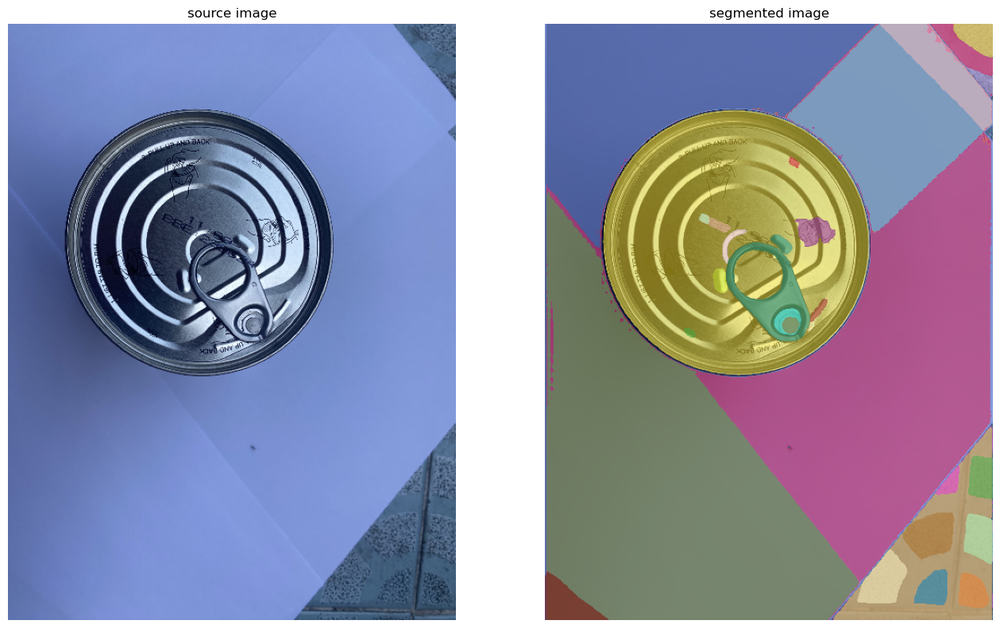

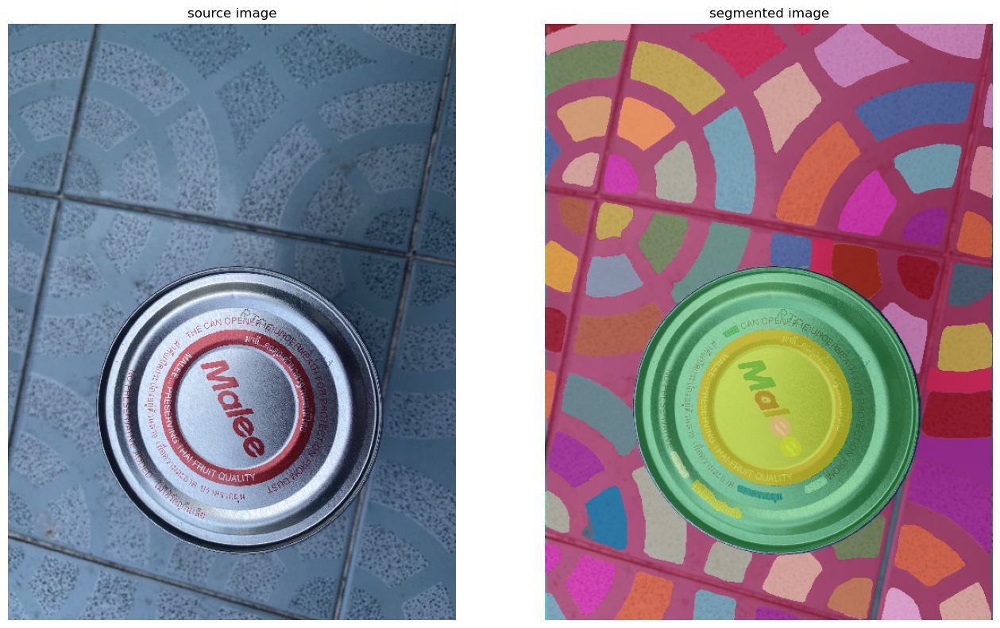

In [10]:
import cv2
import supervision as sv
import os
import numpy as np
import random

def SAM_Image_Compare(sam_result, image_bgr):

    mask_annotator = sv.MaskAnnotator()
    detections = sv.Detections.from_sam(sam_result=sam_result)
    annotated_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

    sv.plot_images_grid(
        images=[image_bgr, annotated_image],
        grid_size=(1, 2),
        size=(16, 16),
        titles=['source image', 'segmented image']
    )





for i in range(2) :

    
    IMAGE_PATH = random.sample(jpg_files, 1)[0]
    image_bgr = cv2.imread(IMAGE_PATH)
    
    # Get the current height and width of the image
    h, w = image_bgr.shape[:2]
    # Calculate the new height with the same aspect ratio
    
    new_w = 512

    ratio = new_w / w
    
    image_bgr = cv2.resize(image_bgr , (int(new_w), int(int(h * ratio))))
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    # Clear CUDA memory
    torch.cuda.empty_cache()
    sam_result = mask_generator.generate(image_rgb)

    SAM_Image_Compare(sam_result, image_bgr)

### Output format

`SamAutomaticMaskGenerator` returns a `list` of masks, where each mask is a `dict` containing various information about the mask:

* `segmentation` - `[np.ndarray]` - the mask with `(W, H)` shape, and `bool` type
* `area` - `[int]` - the area of the mask in pixels
* `bbox` - `[List[int]]` - the boundary box of the mask in `xywh` format
* `predicted_iou` - `[float]` - the model's own prediction for the quality of the mask
* `point_coords` - `[List[List[float]]]` - the sampled input point that generated this mask
* `stability_score` - `[float]` - an additional measure of mask quality
* `crop_box` - `List[int]` - the crop of the image used to generate this mask in `xywh` format

### Interaction with segmentation results

In [10]:
def display(image,mask , bbox=None , index = None) :
    # Create a 1x2 grid plot
    fig, ax = plt.subplots(1, 3, figsize=(8, 4))

    # Add the mask image to the first subplot
    ax[0].imshow(mask, cmap='gray')
    ax[0].set_title(f'Mask Image {index}')


    # Apply the mask to the original image
    segmented = cv2.bitwise_and(image.copy(), image.copy(), mask=mask)
    # Add the original image to the second subplot
    ax[1].imshow(segmented)
    ax[1].set_title('Segmented Image')


    rect_img = image.copy()
    # Apply the mask to the original image
    ax[2].imshow(rect_img)
    ax[2].set_title('crop Image')
   

    plt.tight_layout() 
    plt.show()
   


def Loop_display(sam_result, image_rgb, nloop = 10) :
    masks = [
        mask['segmentation']
        for mask
        in sorted(sam_result, key=lambda x: x['area'], reverse=True)
    ]

    rects = [
        mask['bbox']
        for mask
        in sorted(sam_result, key=lambda x: x['area'], reverse=True)
    ]

    nloop = min(len(masks),nloop)


    for i in range(nloop) :
        #Convert the boolean mask to a binary mask
        binary_mask = masks[i].astype(np.uint8) * 255
        bbox        = rects[i]
        display(image_rgb.copy(),binary_mask,bbox,i) 

Device = cuda:0 with Memory =  2517.70556640625 MB


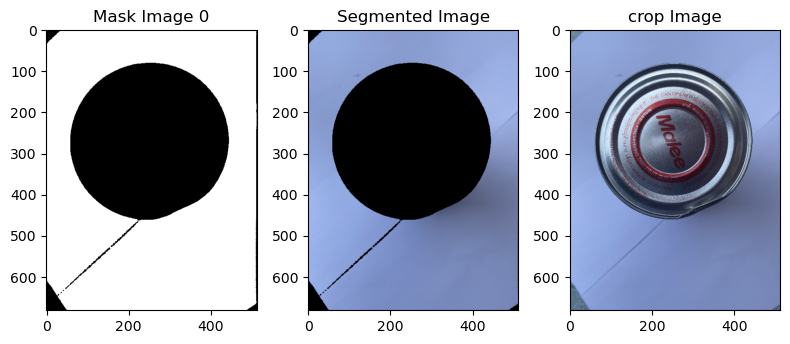

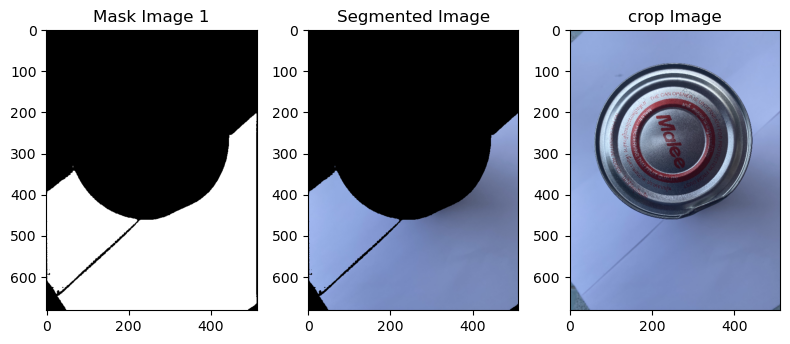

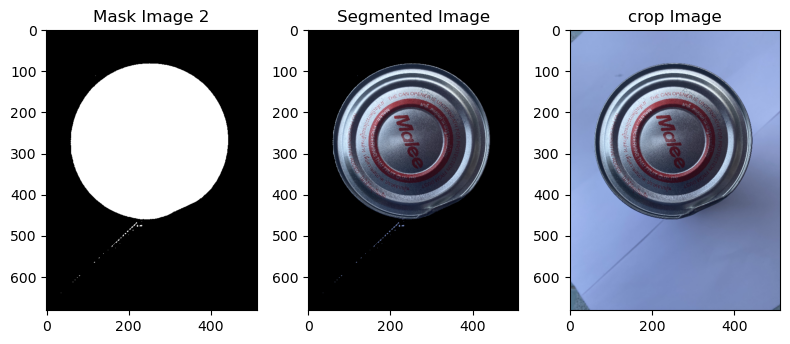

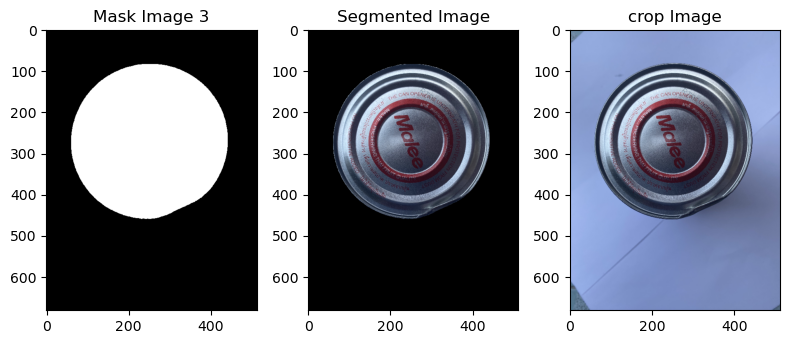

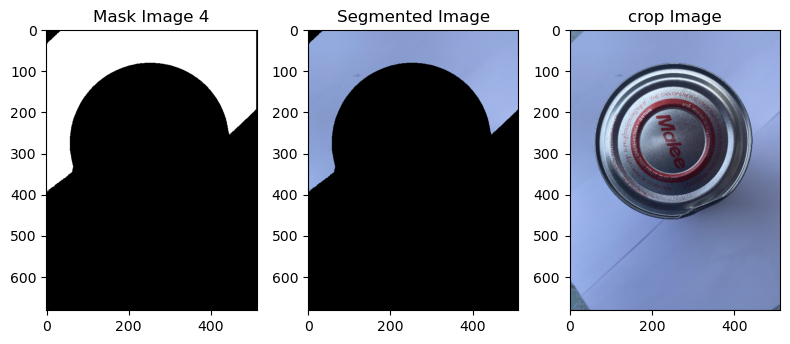

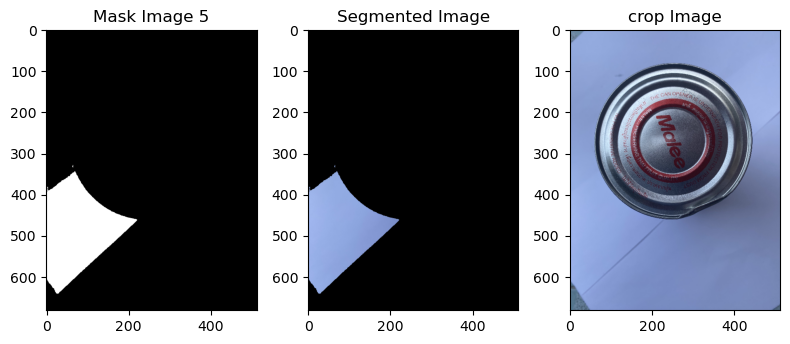

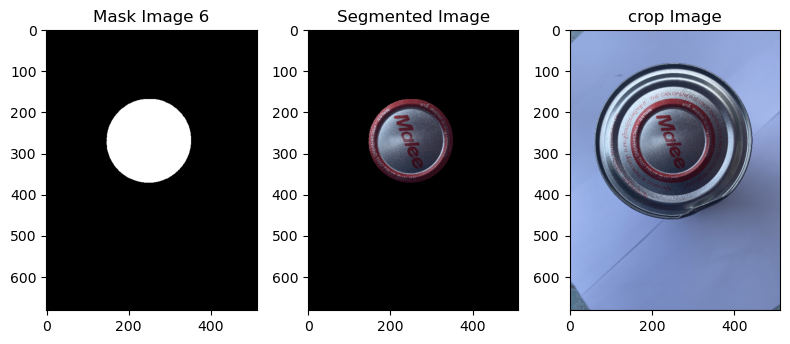

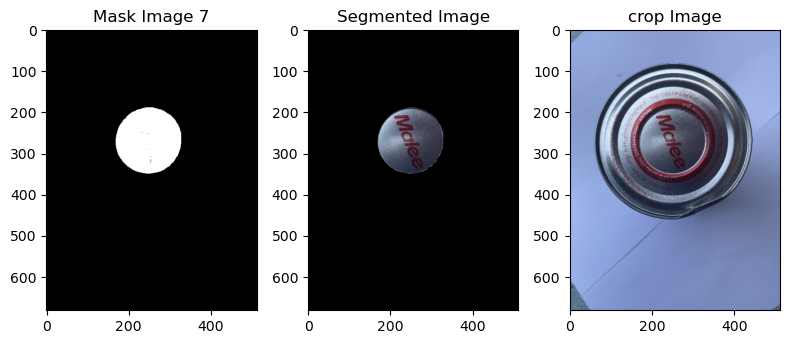

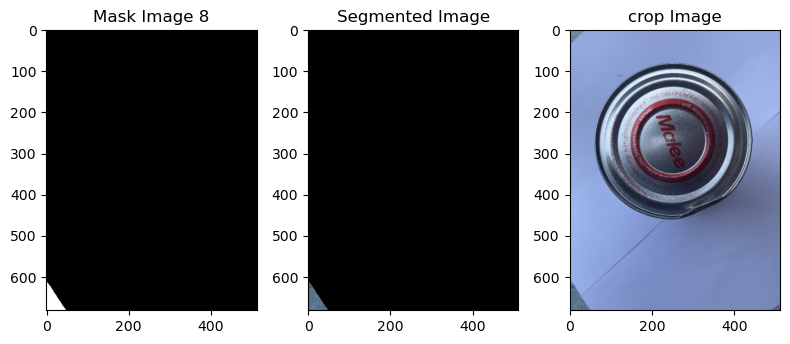

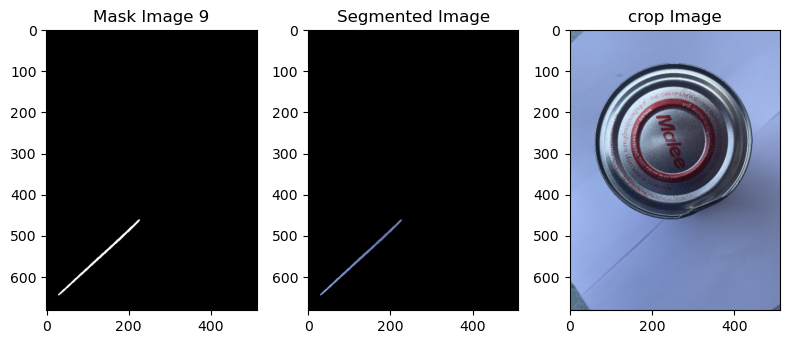

Device = cuda:0 with Memory =  2517.70556640625 MB


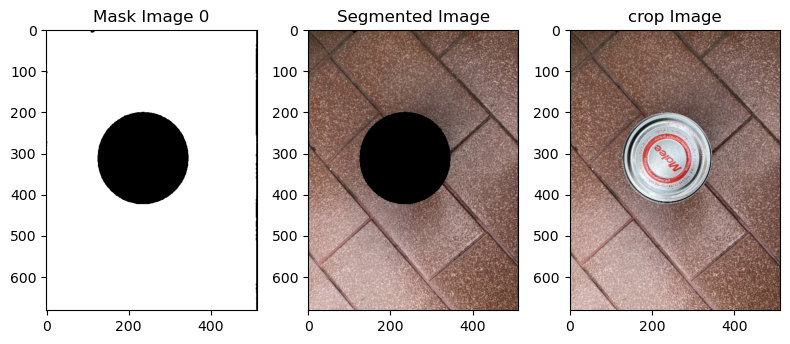

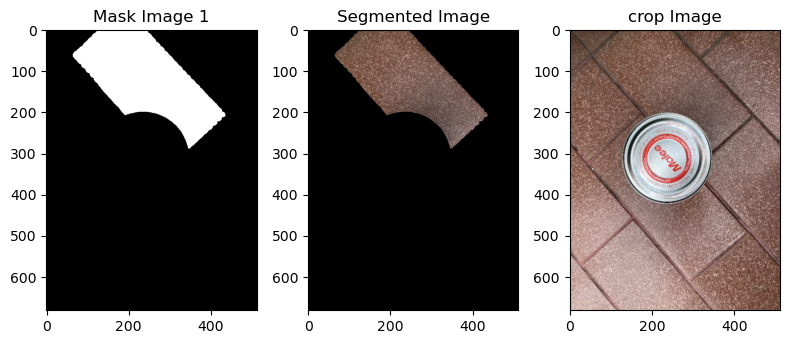

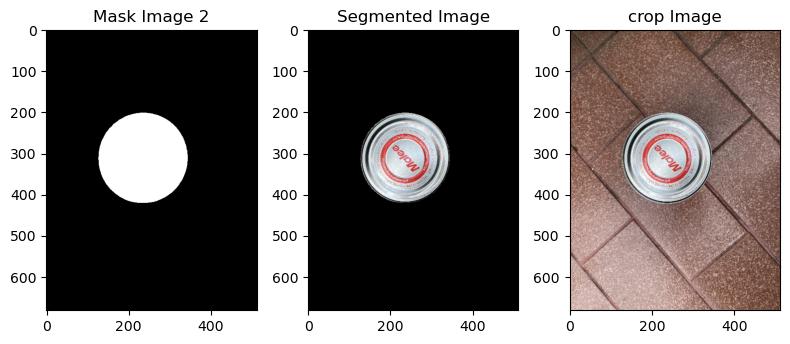

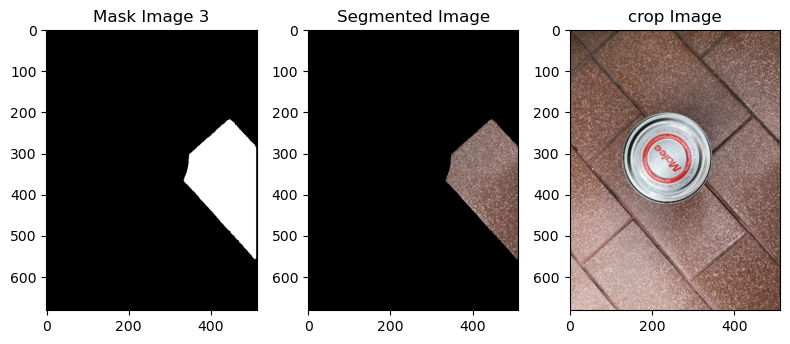

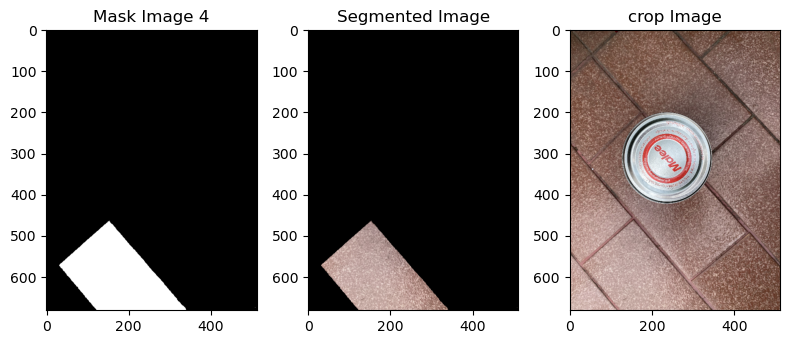

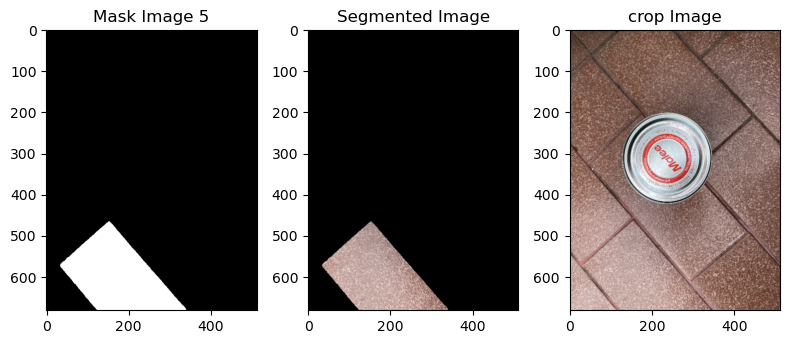

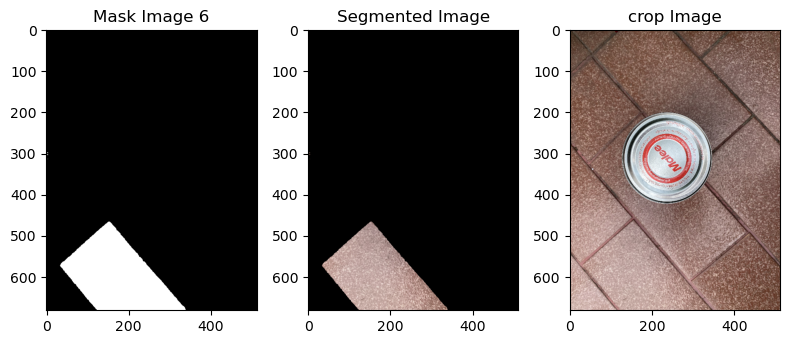

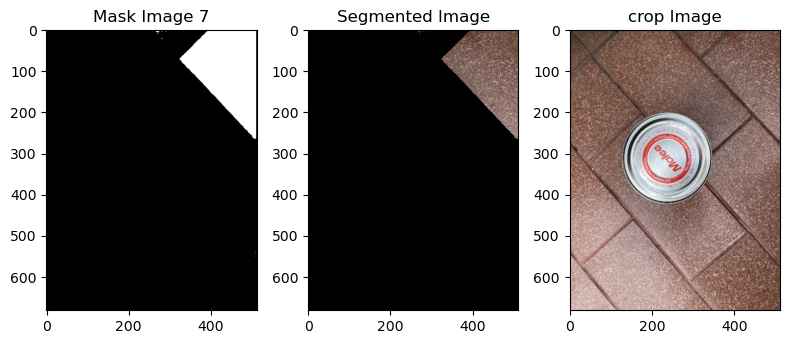

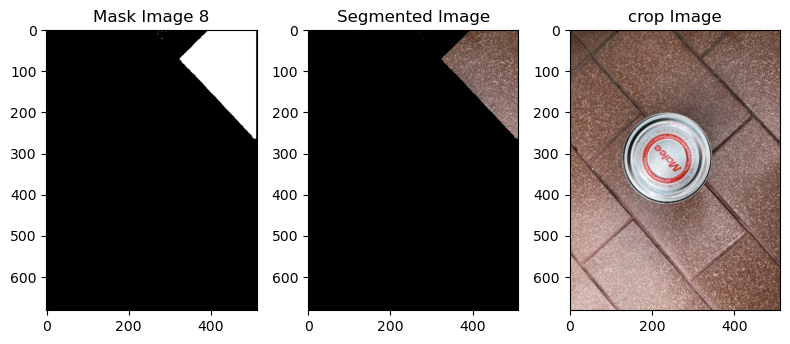

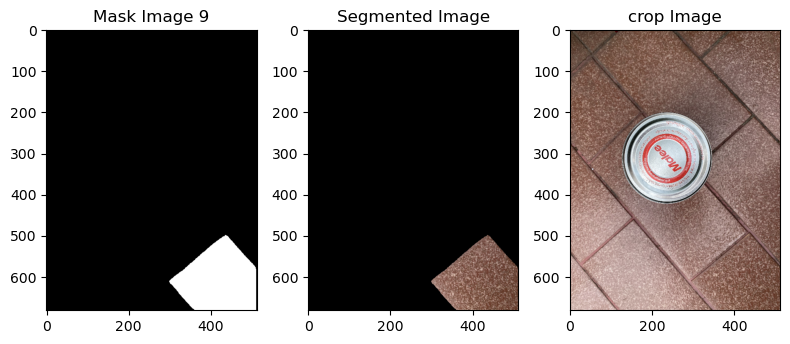

Device = cuda:0 with Memory =  2517.70556640625 MB


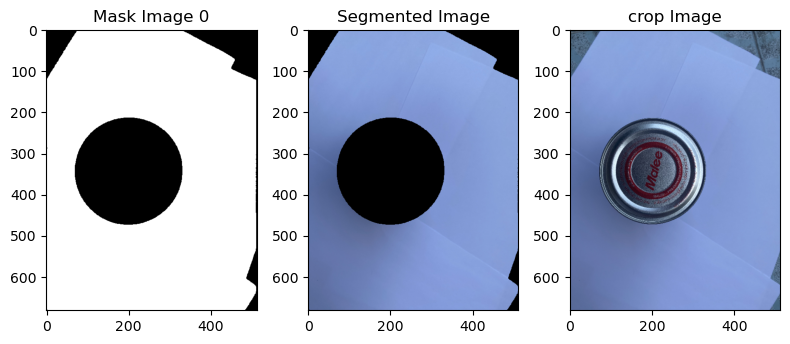

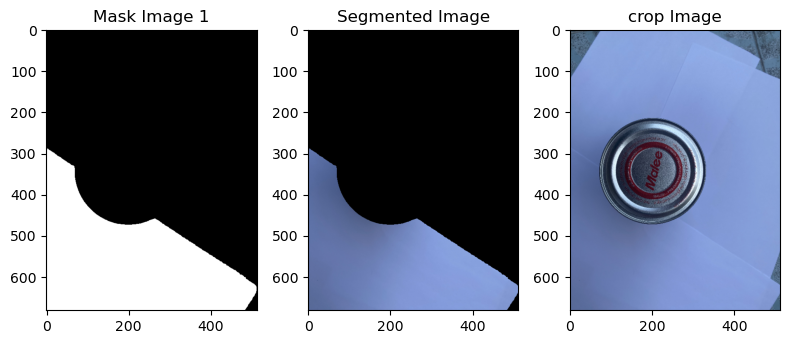

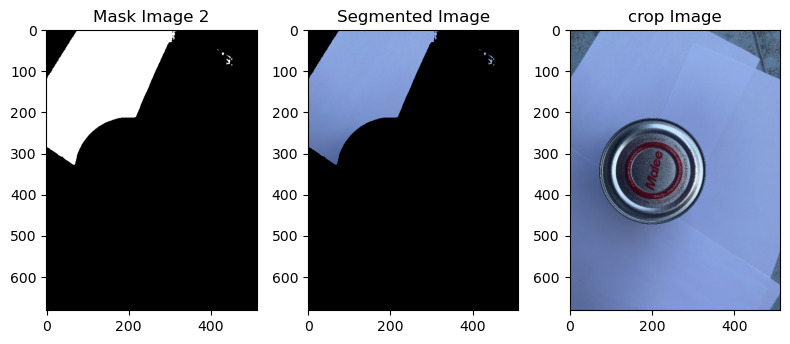

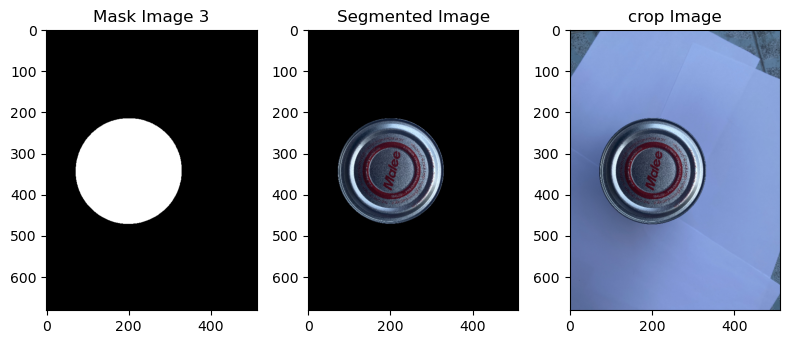

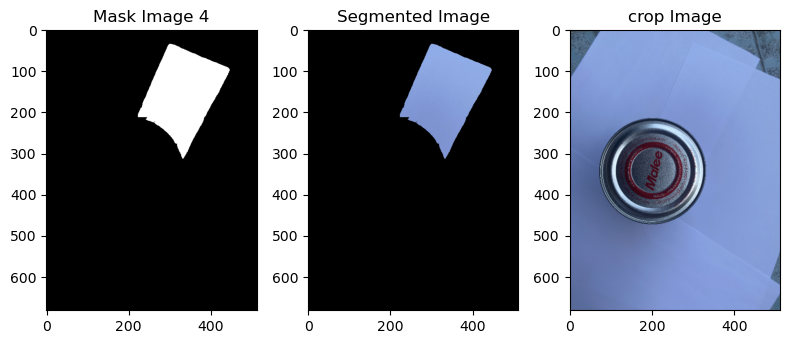

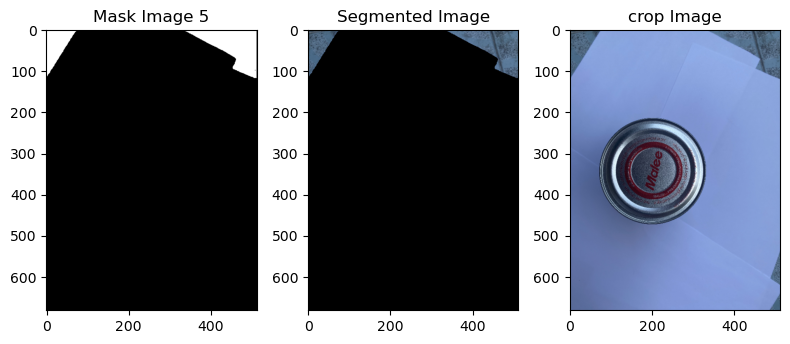

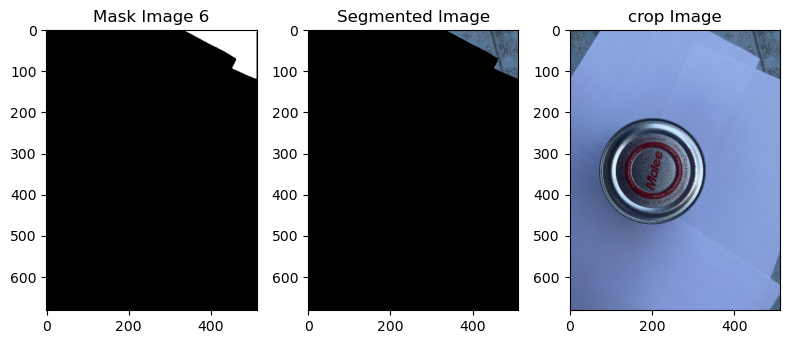

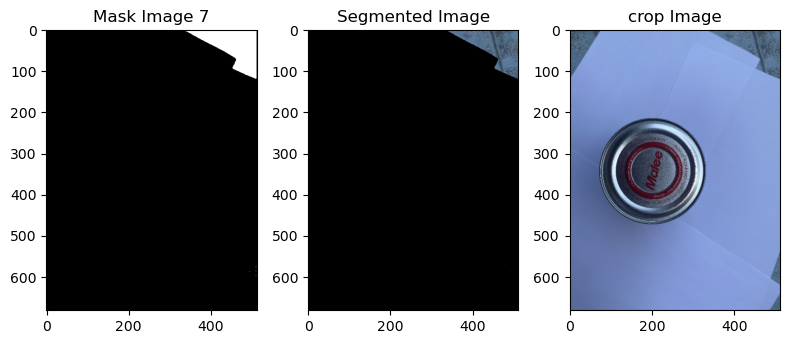

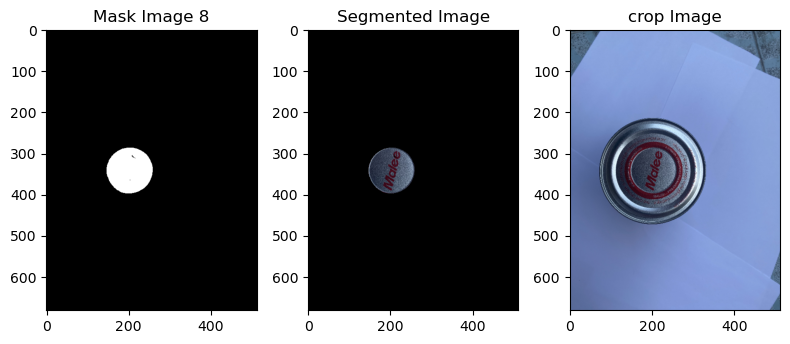

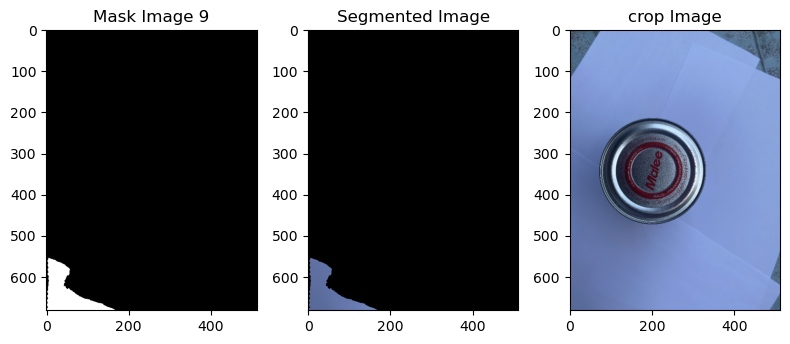

Device = cuda:0 with Memory =  2517.70556640625 MB


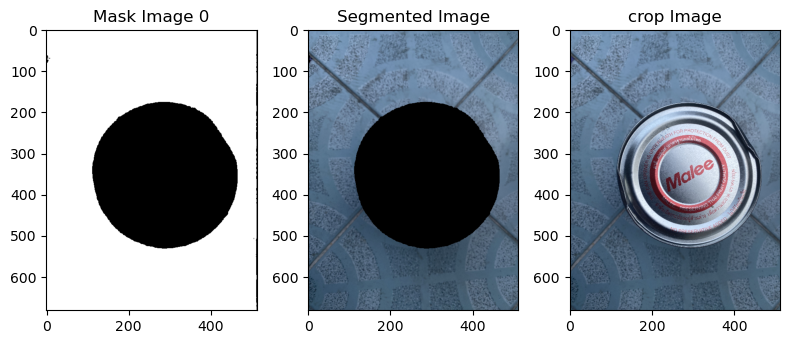

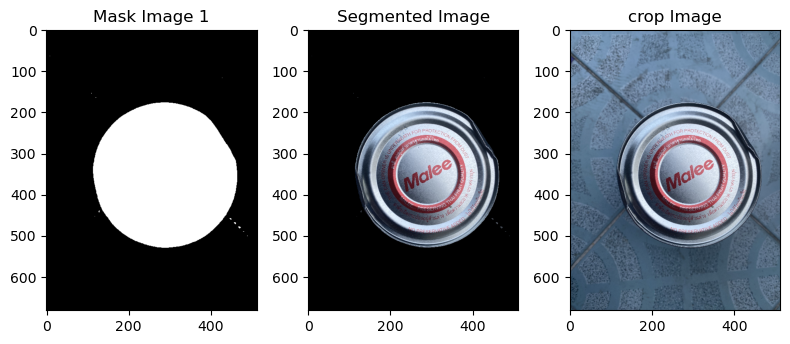

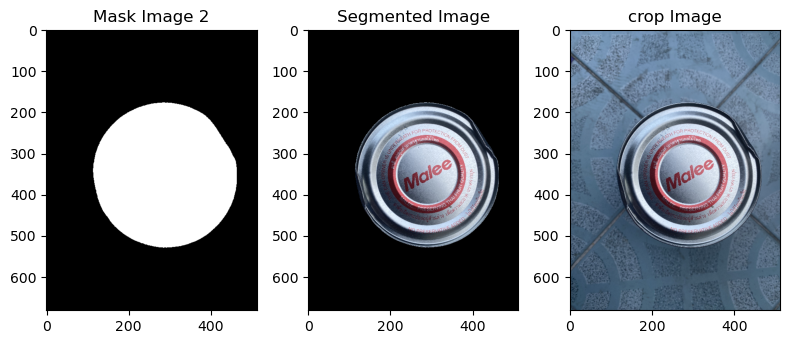

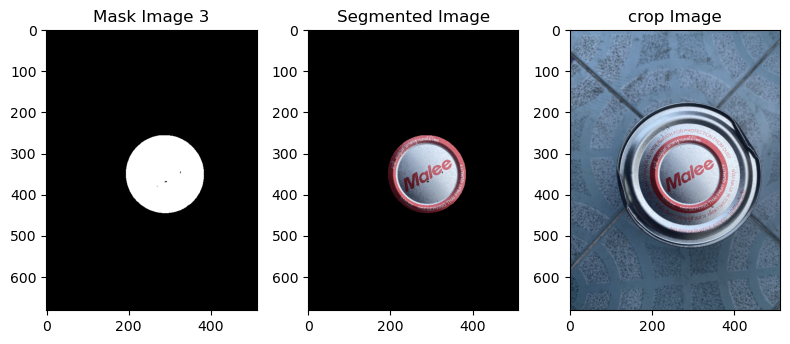

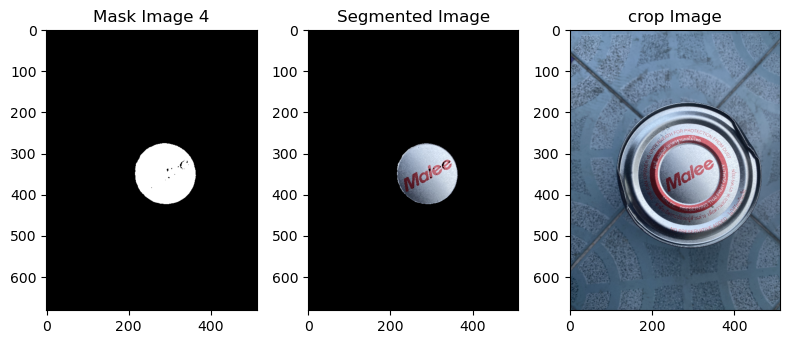

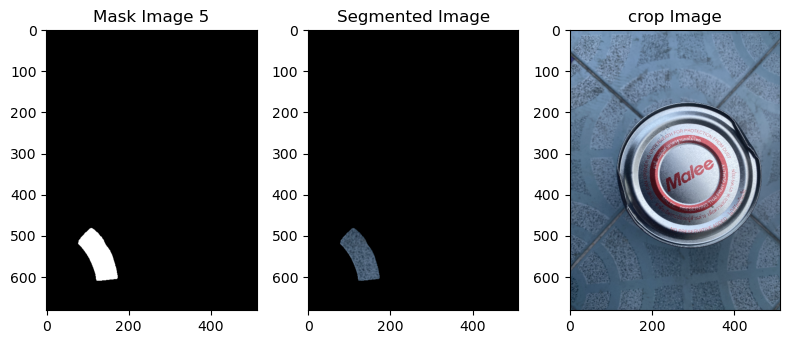

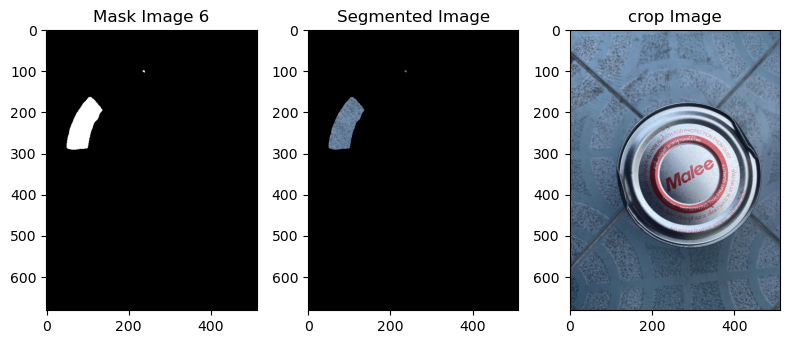

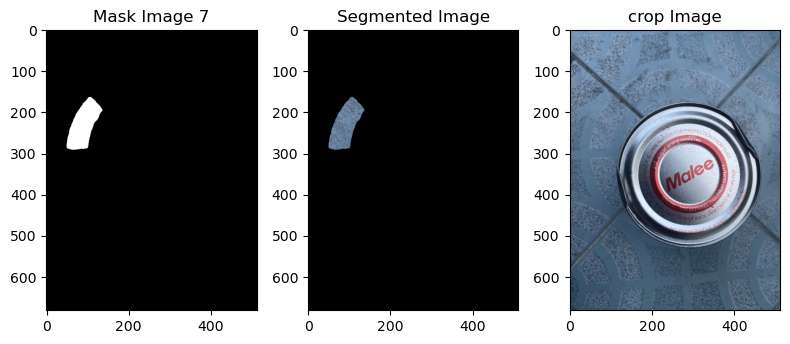

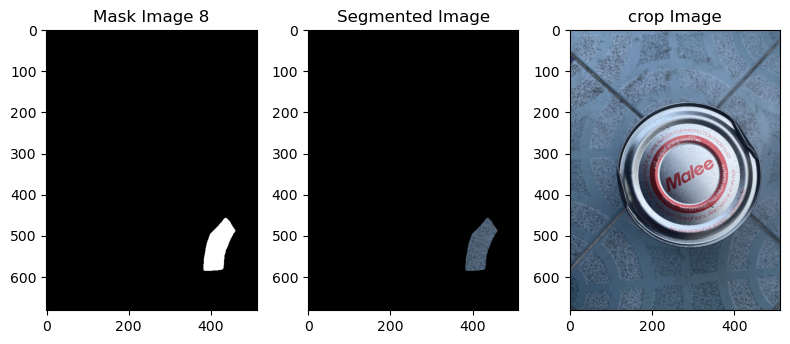

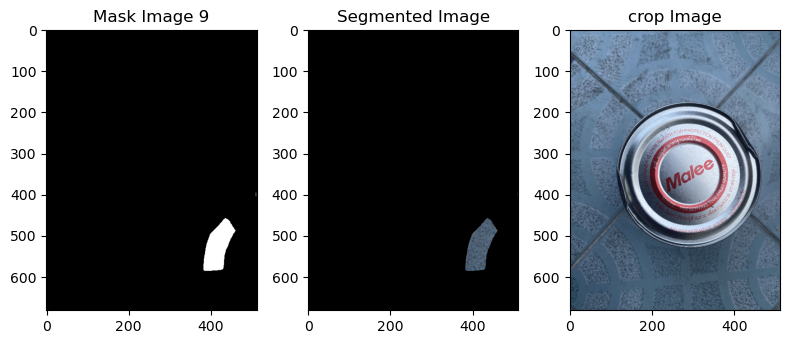

Device = cuda:0 with Memory =  2517.70556640625 MB


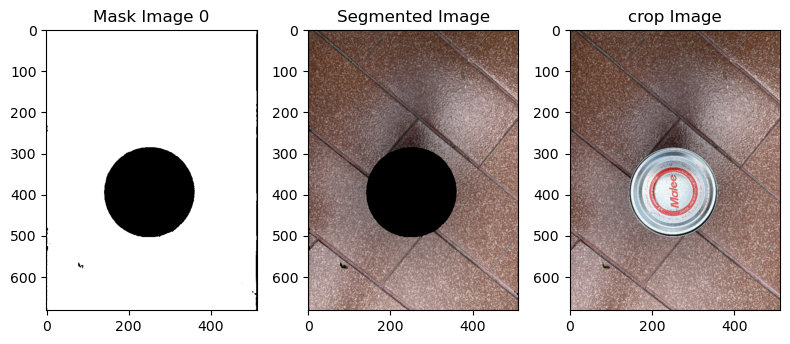

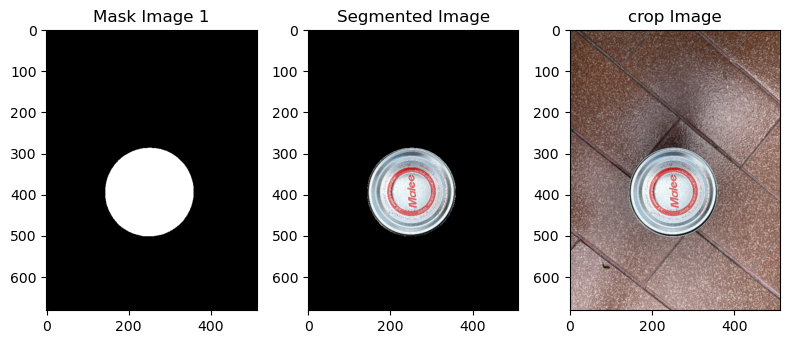

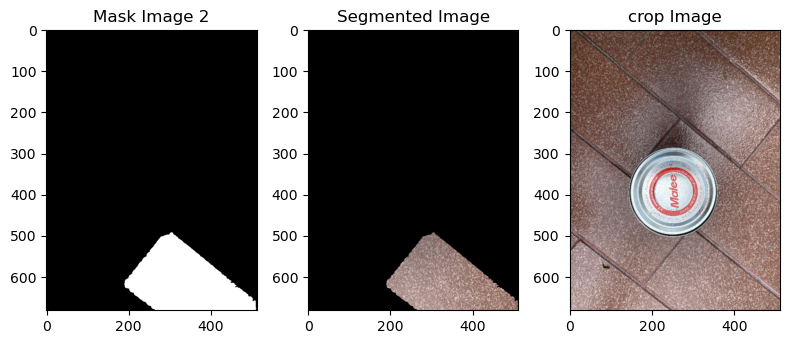

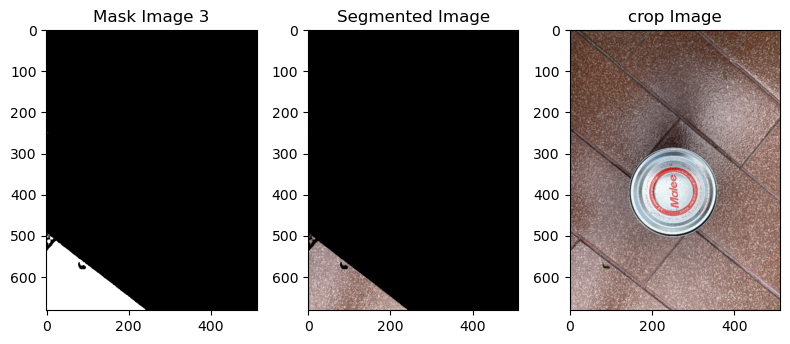

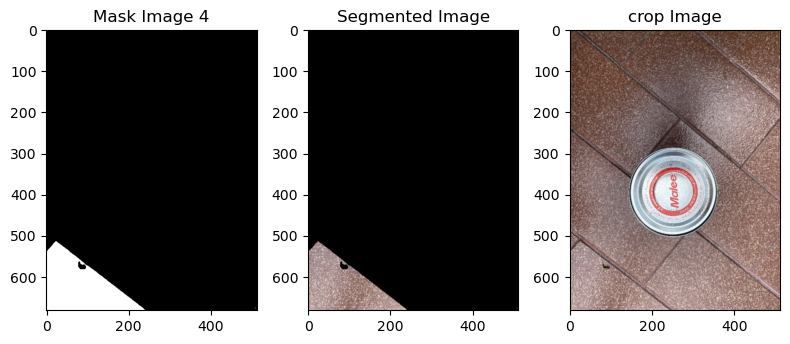

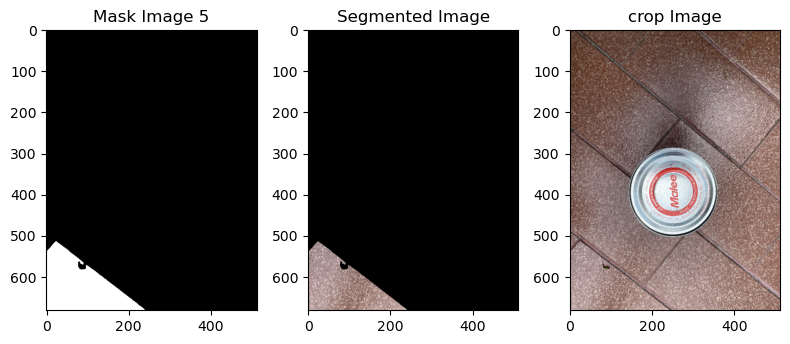

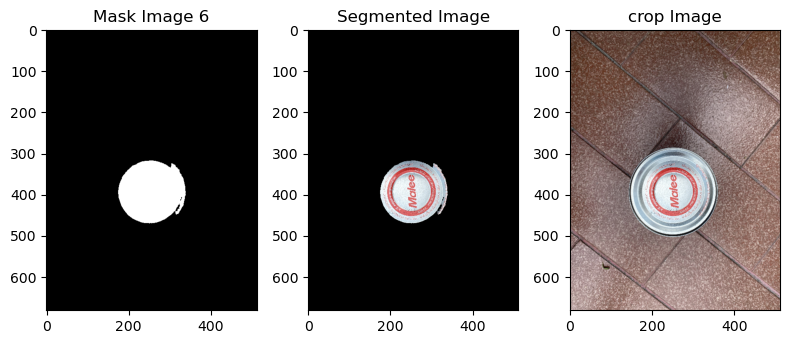

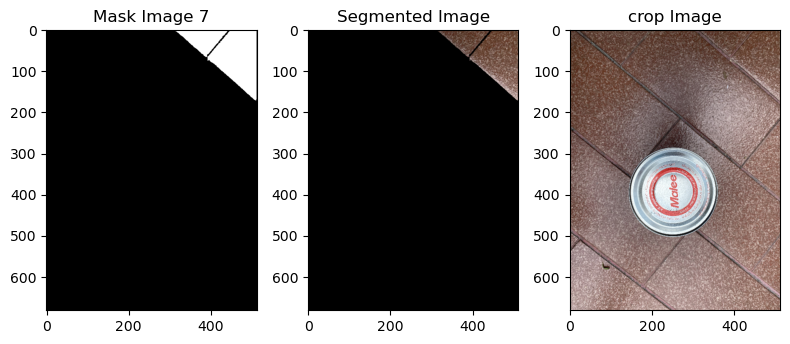

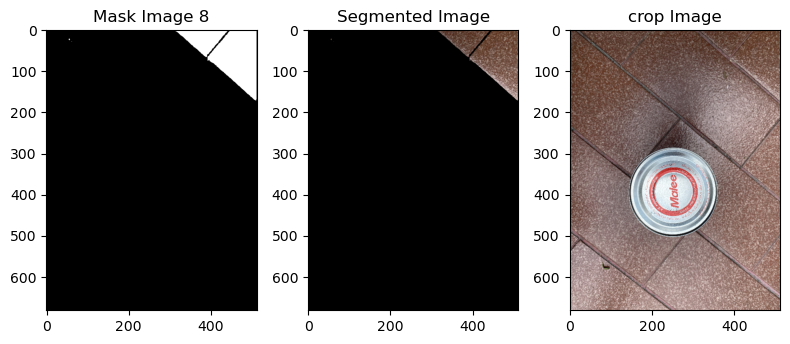

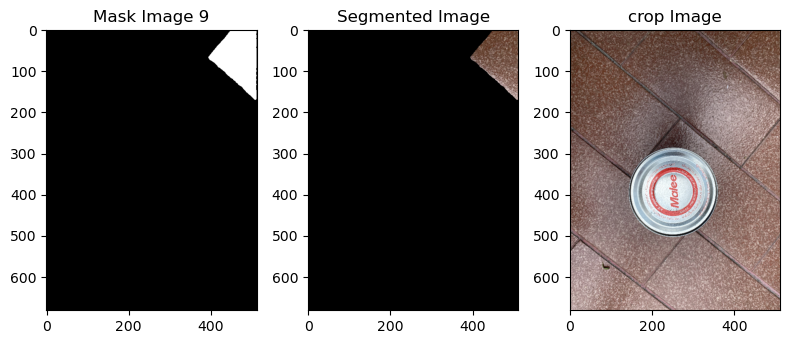

In [11]:

for k in range(5) :

    IMAGE_PATH = random.sample(jpg_files, 1)[0]
    image_bgr = cv2.imread(IMAGE_PATH)

    # Get the current height and width of the image
    h, w = image_bgr.shape[:2]
    # Calculate the new height with the same aspect ratio
    new_w =512

    ratio = new_w / w
    atio = new_w / w
    new_h = int(h * ratio)

    image_bgr = cv2.resize(image_bgr , (int(new_w), int(new_h)))
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    # Clear CUDA memory
    torch.cuda.empty_cache()
    print(f"Device = {DEVICE} with Memory = ",torch.cuda.memory_allocated() / 1024 ** 2, "MB")
    sam_result = mask_generator.generate(image_rgb)


    Loop_display(sam_result, image_rgb, nloop = 10) 

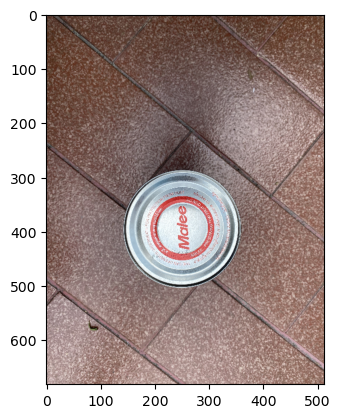

In [13]:
plt.imshow(image_rgb)

In [16]:
%%time  
sam_result = mask_generator.generate(image_rgb)

CPU times: user 2.49 s, sys: 451 ms, total: 2.94 s
Wall time: 2.93 s


In [18]:
# Convert the True/False image to a binary image
img_binary = (img_gray.astype(np.uint8) * 255)

NameError: name 'img_gray' is not defined

In [22]:
image = image_rgb.copy()

masks     = [ mask['segmentation'].astype(np.uint8) * 255 for mask  in sorted(sam_result, key=lambda x: x['area'], reverse=True) ]
bboxs     = [ mask['bbox'] for mask  in sorted(sam_result, key=lambda x: x['area'], reverse=True) ]

segments  =  [ cv2.bitwise_and(image, image, mask=img_binary) for img_binary in  masks]






In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the number of rows and columns
n_rows = 5  # Change this to the number of rows you want
n_cols = 3

# Create the figure and axes for the subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(12, 12))

# Flatten the axes so we can iterate over them using a single loop
axs = axs.flatten()

# Create each subplot and plot the data
for i in range(n_rows * n_cols):
    if i % 3 == 0:
        axs[i].plot(x, y1)
    elif i % 3 == 1:
        axs[i].plot(x, y2)
    else:
        axs[i].plot(x, y3)

# Set the title for each subplot
for i, ax in enumerate(axs):
    ax.set_title(f"Plot {i+1}")

# Set the overall title for the figure
fig.suptitle("My Plot")

# Show the plot
plt.show()

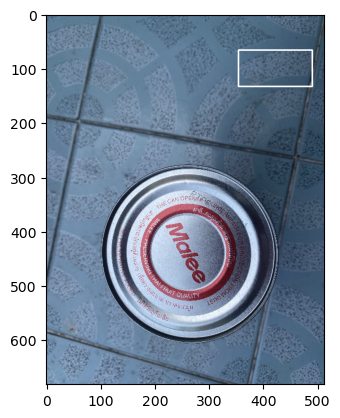

In [30]:
bbox = bboxs[3]

plt.imshow(cv2.rectangle(image_rgb.copy(), (bbox[0], bbox[1]), (bbox[0] + bbox[2], bbox[1] + bbox[3]), (255,255,255), thickness=2))

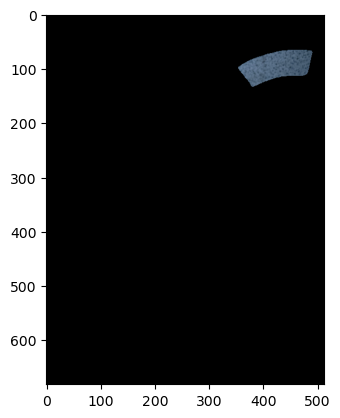

In [29]:
plt.imshow(segments[3])

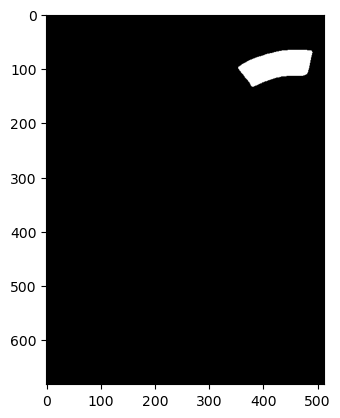

In [31]:
plt.imshow(masks[3],cmap='gray')   

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming the images and masks are stored in numpy arrays
# with shape (10, height, width, channels)
images = np.random.rand(10, 256, 256, 3)
masks = np.random.randint(0, 2, (10, 256, 256, 1))

# Create a subplot of 20*2
fig, ax = plt.subplots(nrows=10, ncols=2, figsize=(8, 40))

# Loop through the images and masks and plot them
for i in range(10):
    # Plot the image in the first column of the subplot
    ax[i, 0].imshow(images[i])
    ax[i, 0].set_title("Image {}".format(i+1))
    ax[i, 0].axis("off")

    # Plot the mask in the second column of the subplot
    ax[i, 1].imshow(masks[i], cmap="gray")
    ax[i, 1].set_title("Mask {}".format(i+1))
    ax[i, 1].axis("off")

# Show the plot
plt.tight_layout()
plt.show()
